In [196]:
! pip install calmap

In [197]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [198]:
import folium

In [199]:
import json
# essential libraries
import json
import random
from urllib.request import urlopen

# storing and anaysis
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap
import folium

# color pallette
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

# converter
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()   

# hide warnings
import warnings
warnings.filterwarnings('ignore')

# html embedding
from IPython.display import Javascript
from IPython.core.display import display
from IPython.core.display import HTML

In [200]:
from urllib.request import urlopen

In [201]:
import numpy as np
import pandas as pd

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns

In [203]:
import plotly.express as px
import plotly.graph_objs as go
import calmap
import folium

In [204]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [205]:
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

In [206]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [207]:
import warnings
warnings.filterwarnings('ignore')

In [208]:
# html embedding
from IPython.display import Javascript
from IPython.core.display import display
from IPython.core.display import HTML

In [209]:
full_table = pd.read_csv('covid_19_clean_complete.csv', parse_dates=['Date'])
full_table

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Thailand,15.0000,101.0000,2020-01-22,2,0,0
1,NaN,Japan,36.0000,138.0000,2020-01-22,2,0,0
2,NaN,Singapore,1.2833,103.8333,2020-01-22,0,0,0
3,NaN,Nepal,28.1667,84.2500,2020-01-22,0,0,0
4,NaN,Malaysia,2.5000,112.5000,2020-01-22,0,0,0
...,...,...,...,...,...,...,...,...
16869,Sint Maarten,Netherlands,18.0425,-63.0548,2020-03-20,1,0,0
16870,NaN,Niger,17.6078,8.0817,2020-03-20,1,0,0
16871,NaN,Papua New Guinea,-6.3150,143.9555,2020-03-20,1,0,0
16872,Isle of Man,United Kingdom,54.2361,-4.5481,2020-03-20,1,0,0


In [210]:
# dataframe info
full_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16874 entries, 0 to 16873
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  7847 non-null   object        
 1   Country/Region  16874 non-null  object        
 2   Lat             16874 non-null  float64       
 3   Long            16874 non-null  float64       
 4   Date            16874 non-null  datetime64[ns]
 5   Confirmed       16874 non-null  int64         
 6   Deaths          16874 non-null  int64         
 7   Recovered       16874 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 1.0+ MB


In [211]:
# checking for missing value
full_table.isna().sum()

Province/State    9027
Country/Region       0
Lat                  0
Long                 0
Date                 0
Confirmed            0
Deaths               0
Recovered            0
dtype: int64

In [212]:
# cases 
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']

# Active Case = confirmed - deaths - recovered
full_table['Active'] = full_table['Confirmed'] - full_table['Deaths'] - full_table['Recovered']

# replacing Mainland china with just China
full_table['Country/Region'] = full_table['Country/Region'].replace('Mainland China', 'China')

# filling missing values 
full_table[['Province/State']] = full_table[['Province/State']].fillna('')
full_table[cases] = full_table[cases].fillna(0)

In [213]:
#Derived Tables
# cases in the ships
ship = full_table[full_table['Province/State'].str.contains('Grand Princess')|full_table['Province/State'].str.contains('Diamond Princess cruise ship')]

# china and the row
#row represents the data from all other countries excluding China
china = full_table[full_table['Country/Region']=='China']
row = full_table[full_table['Country/Region']!='China']

# latest
full_latest = full_table[full_table['Date'] == max(full_table['Date'])].reset_index()
china_latest = full_latest[full_latest['Country/Region']=='China']
row_latest = full_latest[full_latest['Country/Region']!='China']

# latest condensed
full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

In [214]:
temp = full_table.groupby(['Country/Region', 'Province/State'])['Confirmed', 'Deaths', 'Recovered', 'Active'].max()
temp.style.background_gradient(cmap='Reds')

,,Confirmed,Deaths,Recovered,Active
Country/Region,Province/State,,,,
Afghanistan,,24,0,1,23
Albania,,70,2,0,68
Algeria,,90,11,32,55
Andorra,,75,0,1,74
Angola,,1,0,0,1
Antigua and Barbuda,,1,0,0,1
Argentina,,128,3,3,122
Armenia,,136,0,1,135
Australia,Australian Capital Territory,6,0,0,6


In [215]:
# Condensed data as per 10 March 2020. 
temp = full_table.groupby('Date')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
temp = temp[temp['Date']==max(temp['Date'])].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1')

,Date,Confirmed,Deaths,Recovered,Active
0,2020-03-20 00:00:00,272166,11299,87256,173611


In [216]:
tm = temp.melt(id_vars="Date", value_vars=['Active', 'Deaths', 'Recovered'])
fig = px.treemap(tm, path=["variable"], values="value", height=400, width=600, color_discrete_sequence=[rec, act, dth])
fig.show()

In [217]:
#Country wise Data (In each country)
temp_f = full_latest_grouped.sort_values(by='Confirmed', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths,Recovered,Active
0,China,81250,3253,71266,6731
1,Italy,47021,4032,4440,38549
2,Spain,20410,1043,1588,17779
3,Germany,19848,67,180,19601
4,Iran,19644,1433,6745,11466
5,US,19100,244,0,18856
6,France,12726,450,12,12264
7,"Korea, South",8652,94,1540,7018
8,Switzerland,5294,54,15,5225
9,United Kingdom,4014,178,67,3769


In [218]:
#countries with confirmed deaths in Descending order
temp_flg = temp_f[temp_f['Deaths']>0][['Country/Region', 'Deaths']]
temp_flg.sort_values('Deaths', ascending=False).reset_index(drop=True).style.background_gradient(cmap='Reds')

,Country/Region,Deaths
0,Italy,4032
1,China,3253
2,Iran,1433
3,Spain,1043
4,France,450
5,US,244
6,United Kingdom,178
7,Netherlands,107
8,"Korea, South",94
9,Germany,67


In [219]:
#Countries with no cases recovered
temp = temp_f[temp_f['Recovered']==0][['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp.reset_index(drop=True).style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths,Recovered
0,US,19100,244,0
1,Luxembourg,484,4,0
2,Ecuador,367,5,0
3,Turkey,359,4,0
4,Slovenia,341,1,0
5,South Africa,202,0,0
6,Panama,137,1,0
7,Slovakia,137,1,0
8,Bulgaria,127,3,0
9,Uruguay,94,0,0


In [220]:
#Countries with all cases died
temp = row_latest_grouped[row_latest_grouped['Confirmed']==row_latest_grouped['Deaths']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths


In [221]:
#Countries with all the cases recovered
temp = row_latest_grouped[row_latest_grouped['Confirmed']==row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Country/Region,Confirmed,Recovered
0,Nepal,1,1


In [222]:
#Countries with no affected case anymore
temp = row_latest_grouped[row_latest_grouped['Confirmed']==
                          row_latest_grouped['Deaths']+
                          row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Country/Region,Confirmed,Deaths,Recovered
0,Nepal,1,0,1


In [223]:
#Chinese province wise data
temp_f = china_latest_grouped[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f = temp_f.sort_values(by='Confirmed', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Hubei,67800,3133,58382
1,Guangdong,1395,8,1323
2,Henan,1273,22,1250
3,Zhejiang,1234,1,1219
4,Hunan,1018,4,1014
5,Anhui,990,6,984
6,Jiangxi,935,1,934
7,Shandong,762,7,748
8,Jiangsu,631,0,631
9,Chongqing,576,6,570


In [224]:
temp = china_latest_grouped[china_latest_grouped['Recovered']==0]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered


In [225]:
#Provinces with all cases died
temp = china_latest_grouped[china_latest_grouped['Recovered']==0]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered


In [226]:
#Provinces with all the cases recovered
temp = china_latest_grouped[china_latest_grouped['Confirmed']== china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed','Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered
0,Jiangsu,631,0,631
1,Shanxi,133,0,133
2,Ningxia,75,0,75
3,Qinghai,18,0,18
4,Tibet,1,0,1


In [227]:
#Provinces with no affected cases anymore
temp = china_latest_grouped[china_latest_grouped['Confirmed']==
                          china_latest_grouped['Deaths']+
                          china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered
0,Hunan,1018,4,1014
1,Anhui,990,6,984
2,Jiangxi,935,1,934
3,Jiangsu,631,0,631
4,Chongqing,576,6,570
5,Guizhou,146,2,144
6,Shanxi,133,0,133
7,Jilin,93,1,92
8,Xinjiang,76,3,73
9,Inner Mongolia,75,1,74


In [228]:
#Maps Across the world

# World wide

m = folium.Map(location=[0, 0], tiles='cartodbpositron',
               min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(full_latest)):
    folium.Circle(
        location=[full_latest.iloc[i]['Lat'], full_latest.iloc[i]['Long']],
        color='crimson', 
        tooltip =   '<li><bold>Country : '+str(full_latest.iloc[i]['Country/Region'])+
                    '<li><bold>Province : '+str(full_latest.iloc[i]['Province/State'])+
                    '<li><bold>Confirmed : '+str(full_latest.iloc[i]['Confirmed'])+
                    '<li><bold>Deaths : '+str(full_latest.iloc[i]['Deaths'])+
                    '<li><bold>Recovered : '+str(full_latest.iloc[i]['Recovered']),
        radius=int(full_latest.iloc[i]['Confirmed'])**1.1).add_to(m)
m


In [256]:
# Countries with Confirmed cases

fig = px.choropleth(full_latest_grouped, locations="Country/Region", 
                    locationmode='country names', color="Confirmed", 
                    hover_name="Country/Region", range_color=[1,7000], 
                    color_continuous_scale="aggrnyl", 
                    title='Countries with Confirmed Cases')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [230]:
# Countries with Deaths Reported 

fig = px.choropleth(full_latest_grouped[full_latest_grouped['Deaths']>0], 
                    locations="Country/Region", locationmode='country names',
                    color="Deaths", hover_name="Country/Region", 
                    range_color=[1,50], color_continuous_scale="agsunset",
                    title='Countries with Deaths Reported')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [231]:
# # China

# clg = china_latest_grouped.iloc[:, :].copy()

# name = {'Inner Mongolia': 'Inner Mongol',
#         'Tibet': 'Xizang'}
# clg.loc[:, 'Province/State'] = clg.loc[: 'Province/State'].replace(name)

# with urlopen('https://raw.githubusercontent.com/yg2619/Choropleth-Maps-in-Python-Using-Plotly/master/china_geojson.json') as file:
#     china_json = json.load(file)

# fig = go.Figure(go.Choroplethmapbox(geojson=china_json, locations=clg['Province/State'], 
#                                     z=china_latest_grouped['Confirmed'], colorscale='Viridis', zmin=0, zmax=1000,
#                                     marker_opacity=0.8, marker_line_width=0))
# fig.update_layout(mapbox_style="carto-positron",
#                   mapbox_zoom=3, mapbox_center = {"lat": 35.8617, "lon": 104.1954})
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.update_layout(title='Confirmed Cases in Chinese Provincec')
# fig.show()

# -----------------------------------------------------------------------------------------------------------------

# # US

# temp = full_latest.loc[full_latest['Country/Region']=='US', ['Province/State', 'Confirmed']]
# temp['State'] = temp.loc[:, 'Province/State'].str.split(', ').str[-1]
# temp = temp.groupby('State')['Confirmed'].sum().reset_index()

# df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')
# fig = go.Figure(go.Choropleth(locations=temp['State'], z = temp['Confirmed'].astype(float), 
#                               locationmode = 'USA-states', colorscale = 'Viridis'))
# fig.update_layout(geo_scope='usa', title='Confirmed Cases in US States')
# fig.show()

In [232]:
formated_gdf = full_table.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3)

fig = px.scatter_geo(formated_gdf, locations="Country/Region", locationmode='country names', 
                     color="Confirmed", size='size', hover_name="Country/Region", 
                     range_color= [0, max(formated_gdf['Confirmed'])+2], 
                     projection="natural earth", animation_frame="Date", 
                     title='Spread over time')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [254]:
us = full_table[full_table['Country/Region'] == 'US']
us = us[~us['Province/State'].isin(['Diamond Princess', 'Grand Princess'])]

us_latest = us[us['Date']==max(us['Date'])]
us_latest['Code'] = us['Province/State'].map(states)

fig = px.choropleth(us_latest, locations='Code', locationmode="USA-states", color='Confirmed', scope="usa", range_color=[1,50], color_continuous_scale="Sunsetdark", 
                   hover_data = ['Province/State', 'Confirmed', 'Deaths', 'Recovered'], title='US states')
fig.show()

In [234]:
states = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}
        

In [260]:
# Latest cases from the ships
temp = ship[ship['Date']==max(ship['Date'])]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Grand Princess,23,0,0
1,Grand Princess,10,0,0


In [262]:
temp = ship[ship['Date']==max(ship['Date'])]

m = folium.Map(location=[0, 0], tiles='cartodbpositron',
               min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(temp)):
    folium.Circle(
        location=[temp.iloc[i]['Lat'], temp.iloc[i]['Long']],
        color='crimson', 
        tooltip =   '<li><bold>Country : '+str(temp.iloc[i]['Country/Region'])+
                    '<li><bold>Province : '+str(temp.iloc[i]['Province/State'])+
                    '<li><bold>Confirmed : '+str(temp.iloc[i]['Confirmed'])+
                    '<li><bold>Deaths : '+str(temp.iloc[i]['Deaths'])+
                    '<li><bold>Recovered : '+str(temp.iloc[i]['Recovered']),
        radius=100000).add_to(m)
m

In [263]:
temp = full_table.groupby('Date').sum().reset_index()

# adding two more columns
temp['No. of Deaths to 100 Confirmed Cases'] = round(temp['Deaths']/temp['Confirmed'], 3)*100
temp['No. of Recovered to 100 Confirmed Cases'] = round(temp['Recovered']/temp['Confirmed'], 3)*100
# temp['No. of Recovered to 1 Death Case'] = round(temp['Recovered']/temp['Deaths'], 3)

temp = temp.melt(id_vars='Date', value_vars=['No. of Deaths to 100 Confirmed Cases', 'No. of Recovered to 100 Confirmed Cases'], 
                 var_name='Ratio', value_name='Value')

fig = px.line(temp, x="Date", y="Value", color='Ratio',  
              title='Recovery and Mortality Rate Over The Time', color_discrete_sequence=[dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [264]:
temp = full_table.groupby('Date').sum().reset_index()

temp = temp.melt(id_vars='Date', value_vars=['Active', 'Recovered'], 
                 var_name='Case', value_name='Value')

fig = px.line(temp, x="Date", y="Value", color='Case',  
              title='Active & Recovered cases', color_discrete_sequence=[dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [265]:
c_spread = china[china['Confirmed']!=0].groupby('Date')['Province/State'].unique().apply(len)
c_spread = pd.DataFrame(c_spread).reset_index()

fig = px.line(c_spread, x='Date', y='Province/State', text='Province/State',
              title='Number of Provinces/States/Regions of China to which COVID-19 spread over the time',
             color_discrete_sequence=[cnf,dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.update_traces(textposition='top center')
fig.show()

# ------------------------------------------------------------------------------------------

spread = full_table[full_table['Confirmed']!=0].groupby('Date')['Country/Region'].unique().apply(len)
spread = pd.DataFrame(spread).reset_index()

fig = px.line(spread, x='Date', y='Country/Region', text='Country/Region',
              title='Number of Countries/Regions to which COVID-19 spread over the time',
             color_discrete_sequence=[cnf,dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.update_traces(textposition='top center')
fig.show()

In [240]:
flg = full_latest_grouped
flg.head()

,Country/Region,Confirmed,Deaths,Recovered,Active
0,Afghanistan,24,0,1,23
1,Albania,70,2,0,68
2,Algeria,90,11,32,47
3,Andorra,75,0,1,74
4,Angola,1,0,0,1


In [241]:
fig = px.bar(flg.sort_values('Confirmed', ascending=False).head(20).sort_values('Confirmed', ascending=True), 
             x="Confirmed", y="Country/Region", title='Confirmed Cases', text='Confirmed', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Confirmed'])+10000])
fig.update_traces(marker_color='#46cdcf', opacity=0.8, textposition='outside')
fig.show()

In [242]:
fig = px.bar(flg.sort_values('Recovered', ascending=False).head(20).sort_values('Recovered', ascending=True), 
             x="Recovered", y="Country/Region", title='Recovered', text='Recovered', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Recovered'])+10000])
fig.update_traces(marker_color=rec, opacity=0.6, textposition='outside')
fig.show()

In [267]:
fig = px.bar(flg.sort_values('Active', ascending=False).head(20).sort_values('Active', ascending=True), 
             x="Active", y="Country/Region", title='Active', text='Active', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Active'])+3000])
fig.update_traces(marker_color='#f0134d', opacity=0.6, textposition='outside')
fig.show()

In [266]:
fig = px.bar(flg.sort_values('Deaths', ascending=False).head(20).sort_values('Deaths', ascending=True), 
             x="Deaths", y="Country/Region", title='Deaths', text='Deaths', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Deaths'])+500])
fig.update_traces(marker_color='#ff1e56', opacity=0.8, textposition='outside')
fig.show()

In [244]:
# (Only countries with more than 100 case are considered)

flg['Mortality Rate'] = round((flg['Deaths']/flg['Confirmed'])*100, 2)
temp = flg[flg['Confirmed']>100]
temp = temp.sort_values('Mortality Rate', ascending=False)

fig = px.bar(temp.sort_values('Mortality Rate', ascending=False).head(15).sort_values('Mortality Rate', ascending=True), 
             x="Mortality Rate", y="Country/Region", text='Mortality Rate', orientation='h', 
             width=700, height=600, range_x = [0, 10], title='No. of Deaths Per 100 Confirmed Case')
fig.update_traces(marker_color='#00a8cc', opacity=0.6, textposition='outside')
fig.show()

In [245]:
# load population dataset
pop_clean_data = pd.read_csv("population_clean.csv")

# select only the latest data
pop = pop_clean_data.loc[:, ['Country Name', '2018']]

# substitute for missing values
cols = ['French Guiana', 'Martinique', 'Palestine' , 'Republic of Ireland', 'Saint Barthelemy', 'Taiwan', 'Vatican City']
pops = [290691, 376480, 4750000, 4920455, 7122, 23476640, 1000]
for c, p in zip(cols, pops):
    temp.loc[temp['Country/Region']== c, 'Population'] = p
    
# replace country names 
name = {
    'Egypt, Arab Rep.': 'Egypt',
    'Hong Kong SAR, China': 'Hong Kong',
    'Iran, Islamic Rep.': 'Iran (Islamic Republic of)',
    'Macao SAR, China': 'Macau',
    'Hong Kong SAR': 'Hong Kong',
    'Russian Federation': 'Russia',
    'Slovak Republic': 'Slovakia',
    'Korea, Rep.': 'Republic of Korea',
    'United Kingdom': 'UK',
    'United States': 'US' }
pop.loc[:, 'Country Name'] = pop.loc[: 'Country Name'].replace(name)

# merge dataframes
temp = pd.merge(full_latest_grouped, pop, how='left', right_on='Country Name', left_on='Country/Region')
# print(temp[temp['Country Name'].isna()])

temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active', '2018']]
temp.columns = ['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'Population']
    
# calculate Confirmed/Population
temp['Confirmed Per Million People'] = round(temp['Confirmed']/temp['Population']*1000000, 2)

# countries with population greater that 1 million only
temp = temp[temp['Population']>1000000].sort_values('Confirmed Per Million People', ascending=False).reset_index(drop=True)
# temp.head()

fig = px.bar(temp.head(20).sort_values('Confirmed Per Million People', ascending=True), 
             x='Confirmed Per Million People', y='Country/Region', orientation='h', 
             width=700, height=700, text='Confirmed Per Million People', title='Confirmed cases Per Million People',
             range_x = [0, max(temp['Confirmed Per Million People'])+40])
fig.update_traces(textposition='outside', marker_color='#2a7886', opacity=0.7)
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

In [272]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()

fig = px.bar(temp, x="Date", y="Confirmed", color='Country/Region', orientation='v', height=600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [271]:
fig = px.bar(temp, x="Date", y="Deaths", color='Country/Region', orientation='v', height=600,
             title='Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [270]:
temp = full_table.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x="Date", y="Confirmed", color='Country/Region',title='New cases')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [273]:
HTML('''<div class="flourish-embed flourish-bar-chart-race" data-src="vi sualisation/1571387"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')

In [250]:
# temp = full_table.groupby(['Date', 'Country/Region'])['Confirmed'].sum().reset_index()
# temp = temp.sort_values('Confirmed').reset_index(drop=True).head(20)
# # temp['Date'] = temp['Date'].dt.strftime('%Y-%m-%d')
# temp = temp.sort_values(by='Date')
# temp['Date'] = temp['Date'].apply(lambda x: x.date()).apply(str)
# temp.head()

# fig = px.bar(temp, y='Country/Region', x='Confirmed', color='Country/Region', orientation='h',  
#              title='Over time', animation_frame='Date', height=1000, log_x=True)
# # fig.update_traces(textposition='outside')
# # fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
# # fig.update_layout(yaxis={'categoryorder':'array', 
# #                          'categoryarray':['Hubei','Other Chinese Provinces','Rest of the World']})
# fig.show()

In [251]:
temp = full_table.groupby(['Date', 'Country/Region'])['Confirmed'].sum().reset_index().sort_values('Confirmed', ascending=False)

px.line(temp, x="Date", y="Confirmed", color='Country/Region', title='Cases Spread', height=600)

In [274]:
temp = full_table.groupby(['Date', 'Country/Region'])['Deaths'].sum().reset_index().sort_values('Deaths', ascending=False)

fig = px.line(temp, x="Date", y="Deaths", color='Country/Region', title='Deaths', height=600)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [252]:
fig = px.scatter(full_latest_grouped.sort_values('Deaths', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Deaths', color='Country/Region',
                 text='Country/Region', log_x=True, log_y=True, title='Deaths vs Confirmed')
fig.update_traces(textposition='top center')
fig.show()

In [275]:
gt_100 = full_latest_grouped[full_latest_grouped['Confirmed']>100]['Country/Region'].unique()
temp = full_table[full_table['Country/Region'].isin(gt_100)]
temp = temp.groupby(['Country/Region', 'Date'])['Confirmed'].sum().reset_index()
temp = temp[temp['Confirmed']>100]
# print(temp.head())

min_date = temp.groupby('Country/Region')['Date'].min().reset_index()
min_date.columns = ['Country/Region', 'Min Date']
# print(min_date.head())

from_100th_case = pd.merge(temp, min_date, on='Country/Region')
from_100th_case['N days'] = (from_100th_case['Date'] - from_100th_case['Min Date']).dt.days
# print(from_100th_case.head())

fig = px.line(from_100th_case, x='N days', y='Confirmed', color='Country/Region', title='N days from 100 case')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()
gt_1000 = full_latest_grouped[full_latest_grouped['Confirmed']>1000]['Country/Region'].unique()
temp = full_table[full_table['Country/Region'].isin(gt_1000)]
temp = temp.groupby(['Country/Region', 'Date'])['Confirmed'].sum().reset_index()
temp = temp[temp['Confirmed']>1000]
# print(temp.head())

min_date = temp.groupby('Country/Region')['Date'].min().reset_index()
min_date.columns = ['Country/Region', 'Min Date']
# print(min_date.head())

from_1000th_case = pd.merge(temp, min_date, on='Country/Region')
from_1000th_case['N days'] = (from_1000th_case['Date'] - from_1000th_case['Min Date']).dt.days
# print(from_1000th_case.head())

fig = px.line(from_1000th_case, x='N days', y='Confirmed', color='Country/Region', title='N days from 1000 case')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [276]:
fig = px.treemap(full_latest.sort_values(by='Confirmed', ascending=False).reset_index(drop=True), 
                 path=["Country/Region", "Province/State"], values="Confirmed", height=700,
                 title='Number of Confirmed Cases',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

fig = px.sunburst(full_latest.sort_values(by='Deaths', ascending=False).reset_index(drop=True), 
                 path=["Country/Region", "Province/State"], values="Deaths", height=700,
                 title='Number of Deaths reported',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

In [277]:
# first date
# ----------
first_date = full_table[full_table['Confirmed']>0]
first_date = first_date.groupby('Country/Region')['Date'].agg(['min']).reset_index()
# first_date.head()
from datetime import timedelta  
# last date
# ---------
last_date = full_table.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
last_date = last_date.sum().diff().reset_index()

mask = last_date['Country/Region'] != last_date['Country/Region'].shift(1)
last_date.loc[mask, 'Confirmed'] = np.nan
last_date.loc[mask, 'Deaths'] = np.nan
last_date.loc[mask, 'Recovered'] = np.nan

last_date = last_date[last_date['Confirmed']>0]
last_date = last_date.groupby('Country/Region')['Date'].agg(['max']).reset_index()
# last_date.head()

# first_last
# ----------
first_last = pd.concat([first_date, last_date[['max']]], axis=1)

# added 1 more day, which will show the next day as the day on which last case appeared
first_last['max'] = first_last['max'] + timedelta(days=1)

# no. of days
first_last['Days'] = first_last['max'] - first_last['min']

# task column as country
first_last['Task'] = first_last['Country/Region']

# rename columns
first_last.columns = ['Country/Region', 'Start', 'Finish', 'Days', 'Task']

# sort by no. of days
first_last = first_last.sort_values('Days')
# first_last.head()

# visualization
# --------------

# produce random colors
clr = ["#"+''.join([random.choice('0123456789ABC') for j in range(6)]) for i in range(len(first_last))]

#plot
fig = ff.create_gantt(first_last, index_col='Country/Region', colors=clr, show_colorbar=False, 
                      bar_width=0.2, showgrid_x=True, showgrid_y=True, height=2500, 
                      title=('Gantt Chart'))
fig.show()

In [278]:
# In China
temp = china.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars="Date", 
                 value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x="Date", y="value", color='variable', 
             title='In China',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

#-----------------------------------------------------------------------------

# ROW
temp = row.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars="Date", 
                 value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x="Date", y="value", color='variable', 
             title='Outside China',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [279]:
def from_china_or_not(row):
    if row['Country/Region']=='China':
        return 'From China'
    else:
        return 'Outside China'
    
temp = full_table.copy()
temp['Region'] = temp.apply(from_china_or_not, axis=1)
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Region'] != temp['Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x='Date', y='Confirmed', color='Region', barmode='group', 
             text='Confirmed', title='Confirmed', color_discrete_sequence= [cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

fig = px.bar(temp, x='Date', y='Deaths', color='Region', barmode='group', 
             text='Confirmed', title='Deaths', color_discrete_sequence= [cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.update_traces(textangle=-90)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [280]:
gdf = full_table.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
gdf = gdf.reset_index()

temp = gdf[gdf['Country/Region']=='China'].reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="Date", y="Count", color='Case', facet_col="Case",
            title='China', color_discrete_sequence=[cnf, dth, rec])
fig.show()

temp = gdf[gdf['Country/Region']!='China'].groupby('Date').sum().reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="Date", y="Count", color='Case', facet_col="Case",
             title='ROW', color_discrete_sequence=[cnf, dth, rec])
fig.show()

In [281]:
def location(row):
    if row['Country/Region']=='China':
        if row['Province/State']=='Hubei':
            return 'Hubei'
        else:
            return 'Other Chinese Provinces'
    else:
        return 'Rest of the World'

temp = full_table.copy()
temp['Region'] = temp.apply(location, axis=1)
temp['Date'] = temp['Date'].dt.strftime('%Y-%m-%d')
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars=['Region', 'Date'], value_vars=['Confirmed', 'Deaths', 'Recovered'], 
                 var_name='Case', value_name='Count').sort_values('Count')
# temp = temp.sort_values(['Date', 'Region', 'Case']).reset_index()
temp.head()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
             text='Count', title='Hubei - China - World', animation_frame='Date',
             color_discrete_sequence= [dth, rec, cnf], range_x=[0, 70000])
fig.update_traces(textposition='outside')
# fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
# fig.update_layout(yaxis={'categoryorder':'array', 
#                          'categoryarray':['Hubei','Other Chinese Provinces','Rest of the World']})
fig.show()

temp = full_latest.copy()
temp['Region'] = temp.apply(location, axis=1)
temp = temp.groupby('Region')['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars='Region', value_vars=['Confirmed', 'Deaths', 'Recovered'], 
                 var_name='Case', value_name='Count').sort_values('Count')
temp.head()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
             text='Count', title='Hubei - China - World', 
             color_discrete_sequence= [dth, rec, cnf])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

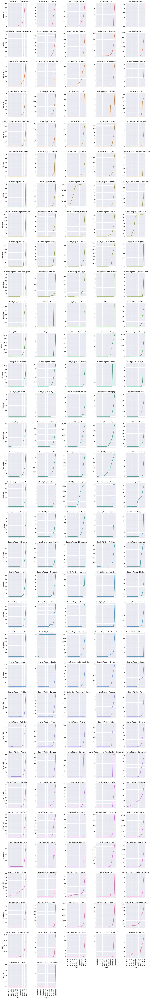

In [282]:
#COUNTRYWISE DATA

temp = full_table.groupby(['Date', 'Country/Region'])['Confirmed'].sum()
temp = temp.reset_index().sort_values(by=['Date', 'Country/Region'])
# temp = temp[temp['Confirmed']>100]

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col="Country/Region", hue="Country/Region", 
                  sharey=False, col_wrap=5)
g = g.map(plt.plot, "Date", "Confirmed")
g.set_xticklabels(rotation=90)
plt.show()

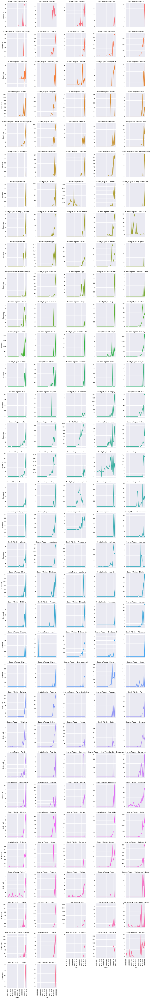

In [283]:
#new cases 

temp = full_table.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

# temp = temp[temp['Confirmed']>100]

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col="Country/Region", hue="Country/Region", 
                  sharey=False, col_wrap=5)
g = g.map(sns.lineplot, "Date", "Confirmed")
g.set_xticklabels(rotation=90)
plt.show()

AttributeError: 'DataFrame' object has no attribute 'ix'

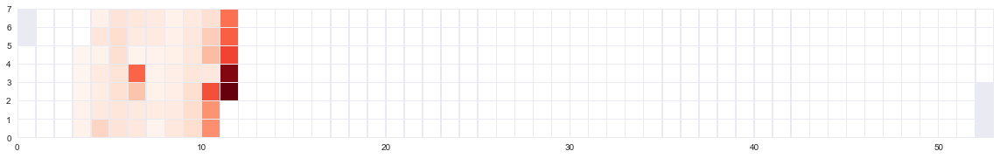

In [291]:
# Calender Map
#number of new cases every say
temp = full_table.groupby('Date')['Confirmed'].sum()
temp = temp.diff()

plt.figure(figsize=(20, 5))
ax = calmap.yearplot(temp, fillcolor='white', cmap='Reds', linewidth=0.5)

AttributeError: 'DataFrame' object has no attribute 'ix'

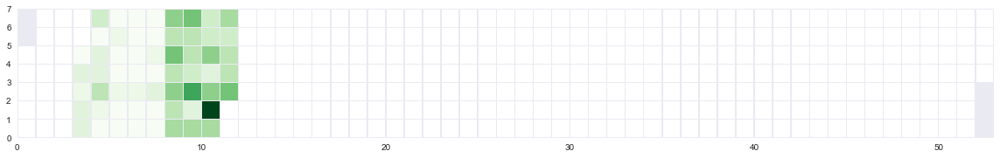

In [290]:
# number of new countries everyday
spread = full_table[full_table['Confirmed']!=0].groupby('Date')
spread = spread['Country/Region'].unique().apply(len).diff()

plt.figure(figsize=(20, 5))
ax = calmap.yearplot(spread, fillcolor='white', cmap='Greens', linewidth=0.5)

In [292]:
#comparison with other epidemics 
epidemics = pd.DataFrame({
    'epidemic' : ['COVID-19', 'SARS', 'EBOLA', 'MERS', 'H1N1'],
    'start_year' : [2019, 2003, 2014, 2012, 2009],
    'end_year' : [2020, 2004, 2016, 2017, 2010],
    'confirmed' : [full_latest['Confirmed'].sum(), 8096, 28646, 2494, 6724149],
    'deaths' : [full_latest['Deaths'].sum(), 774, 11323, 858, 19654]
})

epidemics['mortality'] = round((epidemics['deaths']/epidemics['confirmed'])*100, 2)

epidemics.head()

,epidemic,start_year,end_year,confirmed,deaths,mortality
0,COVID-19,2019,2020,272166,11299,4.15
1,SARS,2003,2004,8096,774,9.56
2,EBOLA,2014,2016,28646,11323,39.53
3,MERS,2012,2017,2494,858,34.40
4,H1N1,2009,2010,6724149,19654,0.29


In [293]:
#analysis on other epidemics. 
temp = epidemics.melt(id_vars='epidemic', value_vars=['confirmed', 'deaths', 'mortality'],
                      var_name='Case', value_name='Value')

fig = px.bar(temp, x="epidemic", y="Value", color='epidemic', text='Value', facet_col="Case",
             color_discrete_sequence = px.colors.qualitative.Bold)
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_yaxes(showticklabels=False)
fig.layout.yaxis2.update(matches=None)
fig.layout.yaxis3.update(matches=None)
fig.show()